# Importing Libraries

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import pickle

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# Importing Data

In [2]:
data = pd.read_csv('water_potability.csv').dropna()

In [3]:
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0


In [4]:
data.shape

(2011, 10)

# Exploratory Data Analysis

<Figure size 1380x920 with 0 Axes>

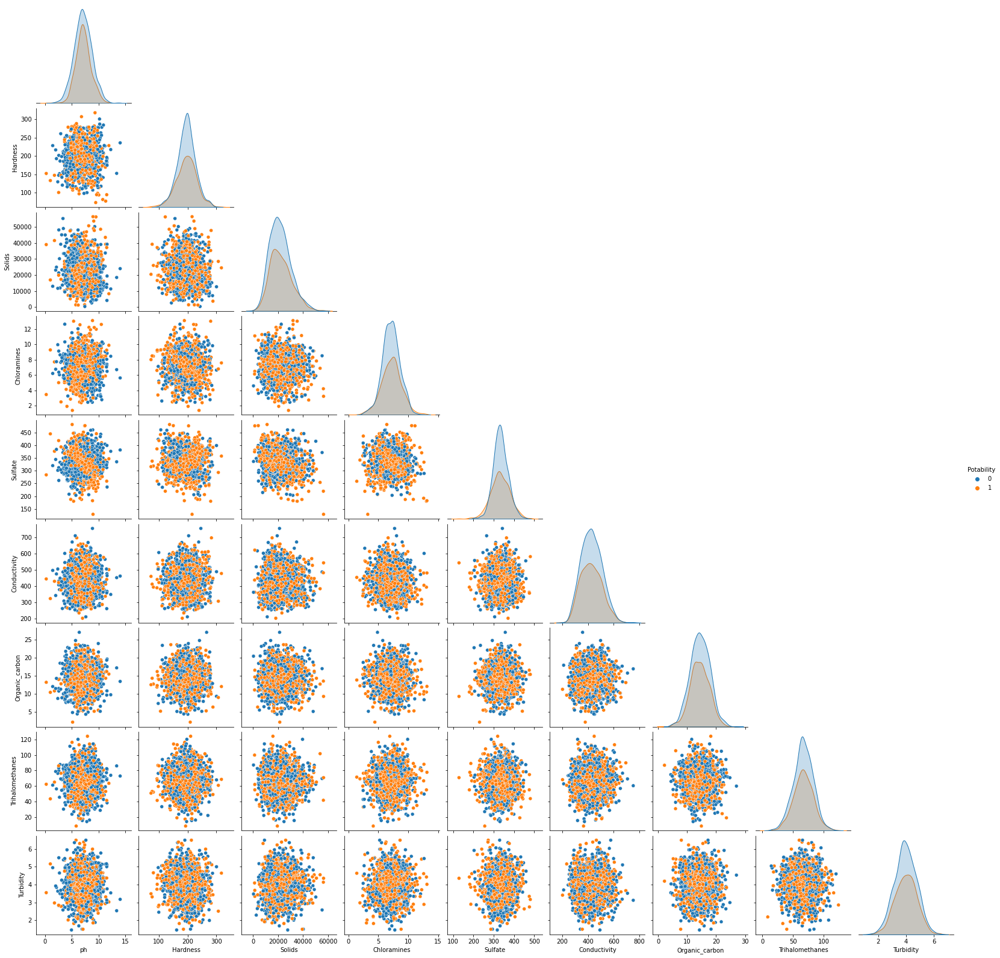

In [5]:
plt.figure(dpi=230)
sns.pairplot(data = data, hue = 'Potability', corner = True)
plt.show()

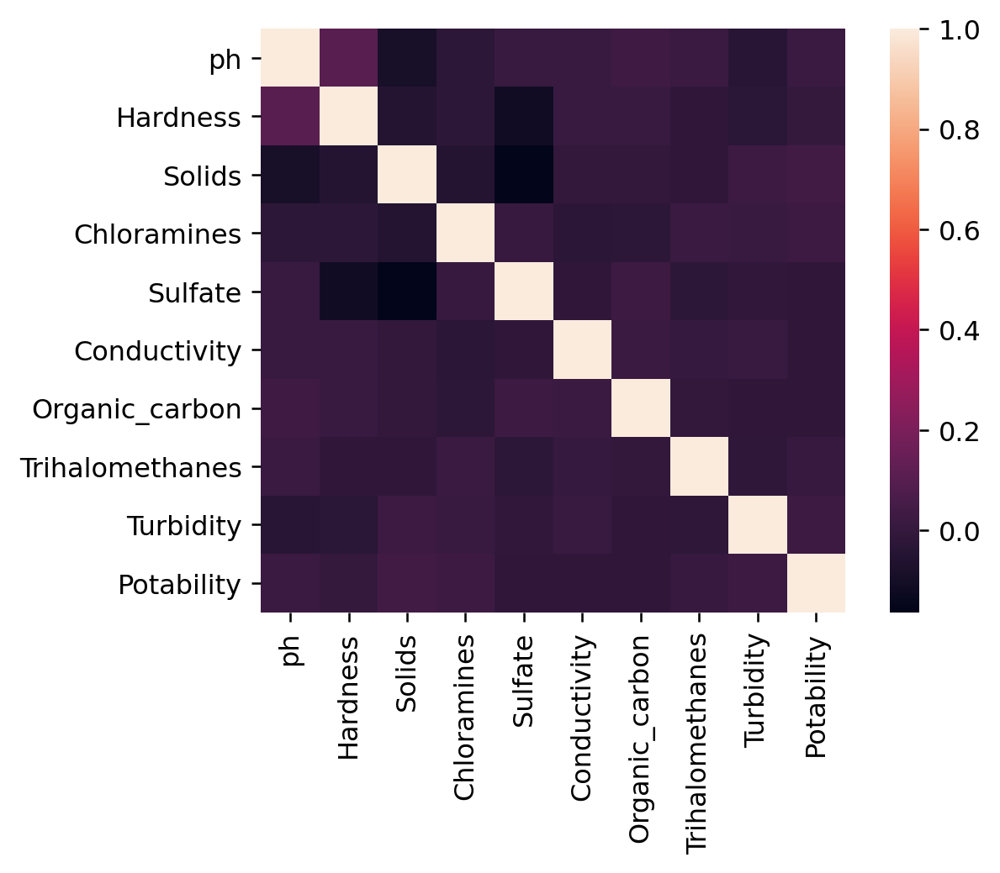

In [6]:
corr_mat = data.corr()

plt.figure(dpi=230)
sns.heatmap(corr_mat, square = True)
plt.show()

# Modelling

In [7]:
inputs = data.drop('Potability', axis = 1)
targets = data['Potability']

In [8]:
scaler = StandardScaler()
inputs_scaled = pd.DataFrame(scaler.fit_transform(inputs), columns = inputs.columns)

In [21]:
inputs_scaled.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,0.782466,0.564114,0.011687,0.583804,0.574378,-0.783962,1.227032,2.111652,0.844761
1,1.275463,-0.455653,-0.455835,-0.370947,-0.560480,-0.348429,-0.842154,-2.140399,0.135033
2,-0.954835,-0.234614,0.790645,0.259104,-0.158911,-1.810063,-1.792340,-0.714423,-1.807366
3,1.994902,1.596951,0.790764,0.239248,1.467140,-1.770608,-0.170876,1.132494,-1.662163
4,0.985323,0.226606,-0.954313,-1.622878,-0.726179,0.595858,-0.599824,-0.224135,0.553348


In [9]:
inputs_train, inputs_test, targets_train, targets_test = train_test_split(inputs_scaled, targets, train_size = 0.8)

In [10]:
log_model = LogisticRegression()
svc_model = SVC()
nn_model = MLPClassifier()
dt_model = DecisionTreeClassifier()
rf_model = RandomForestClassifier()
gb_model = GradientBoostingClassifier()

In [11]:
log_model.fit(inputs_train, targets_train)
svc_model.fit(inputs_train, targets_train)
nn_model.fit(inputs_train, targets_train)
dt_model.fit(inputs_train, targets_train)
rf_model.fit(inputs_train, targets_train)
gb_model.fit(inputs_train, targets_train)

C:\Users\mjski\AppData\Local\Programs\Python\Python38\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:582: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


GradientBoostingClassifier()

In [12]:
print(f'Log Model: {round(log_model.score(inputs_test, targets_test) * 100, 2)}%')
print(f'SVC Model: {round(svc_model.score(inputs_test, targets_test) * 100, 2)}%')
print(f'NN Model: {round(nn_model.score(inputs_test, targets_test) * 100, 2)}%')
print(f'DT Model: {round(dt_model.score(inputs_test, targets_test) * 100, 2)}%')
print(f'RF Model: {round(rf_model.score(inputs_test, targets_test) * 100, 2)}%')
print(f'GB Model: {round(gb_model.score(inputs_test, targets_test) * 100, 2)}%')

Log Model: 61.54%
SVC Model: 68.24%
NN Model: 66.0%
DT Model: 62.78%
RF Model: 66.25%
GB Model: 67.74%


# Exporting Model and Scaler

In [18]:
pickle.dump(svc_model, open('svc-model.pkl', 'wb'))
pickle.dump(scaler, open('scaler.pkl', 'wb'))